In [2]:
import torch
import PIL
import numpy as np
import matplotlib.pyplot as plt
import torchvision.transforms as transforms

from PIL import Image
import os
from glob import glob

In [32]:
folder_1k = "test/1k"
folder_256_co = "test/256_channel_only"
folder_256_co_transform = "test/256_rc" # "test/256_co_transform"


list_of_files_1k = os.listdir(folder_1k)

def get_corresponding_img(folder_1k, folder_256_co, folder_256_co_transform, file_name):
    img_1k = Image.open(os.path.join(folder_1k, file_name))
    img_256_co = Image.open(os.path.join(folder_256_co, file_name))
    img_256_co_transform = Image.open(os.path.join(folder_256_co_transform, file_name))
    return img_1k, img_256_co, img_256_co_transform

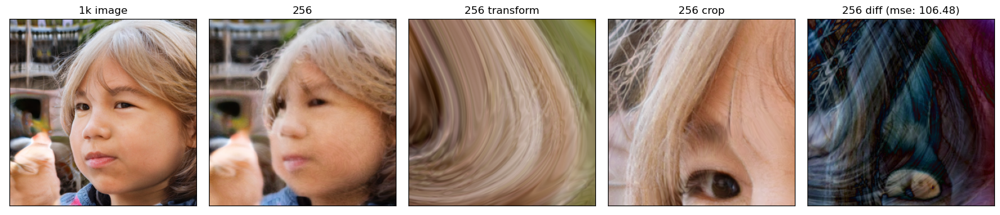

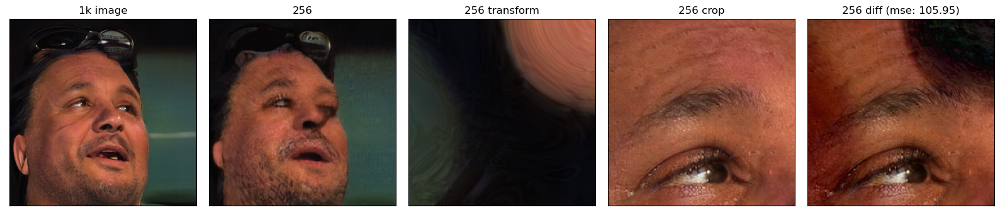

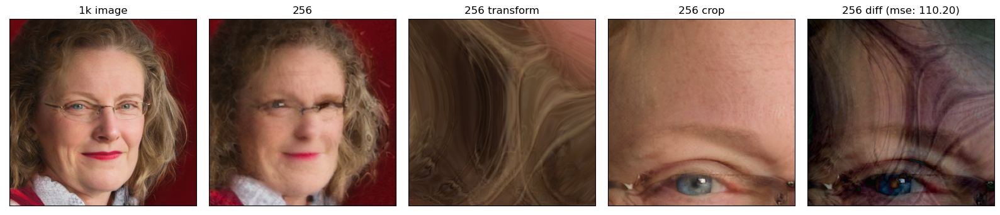

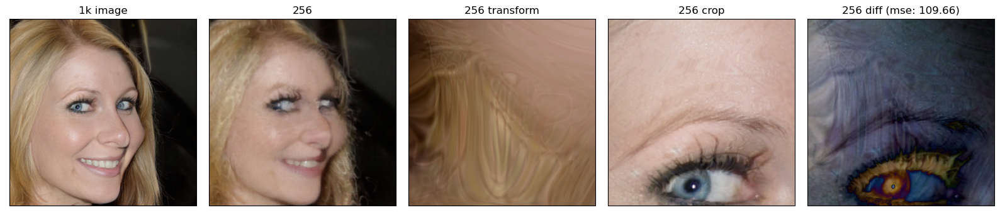

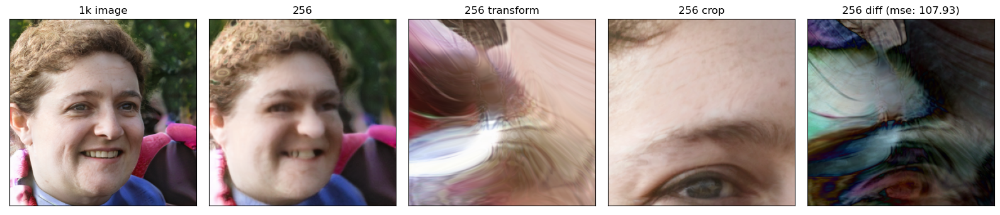

...

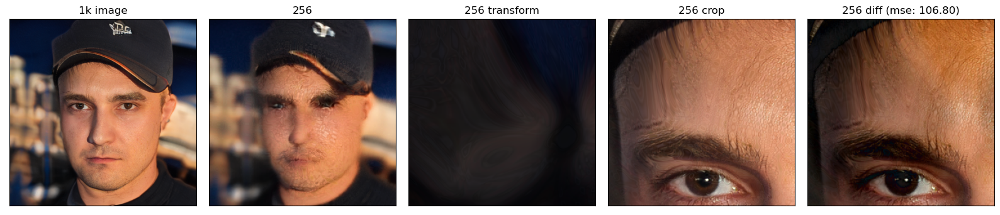

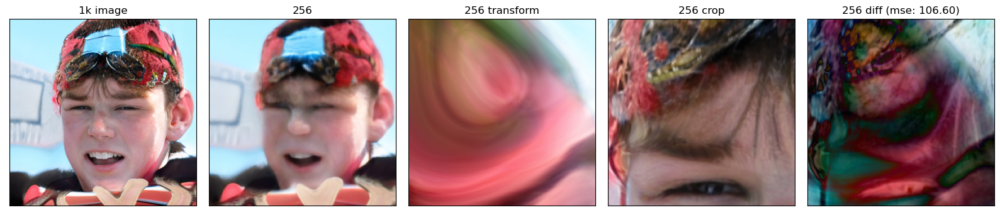

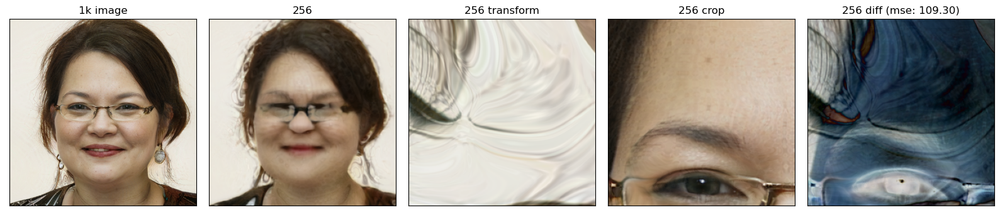

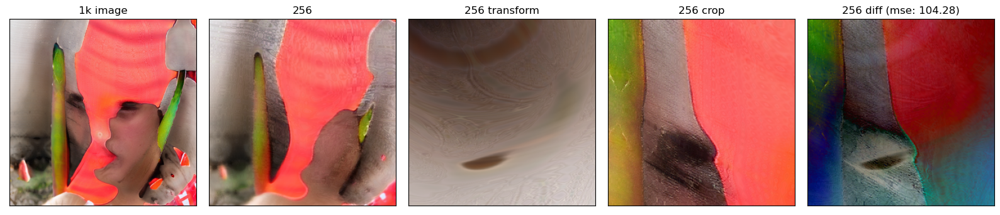

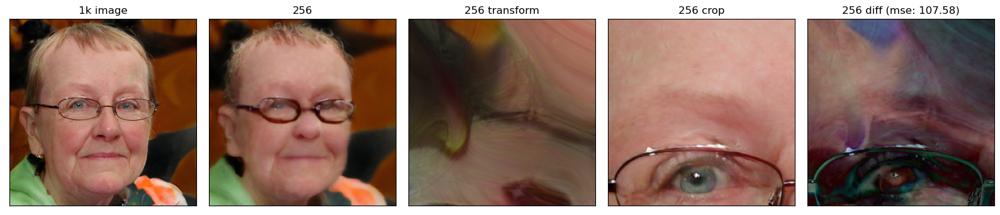

In [33]:

out_dir = "test/compare5init"
if not os.path.exists(out_dir):
    os.makedirs(out_dir)

from PIL import ImageChops

crop_params = (256, 512, 256, 512)

for file_name in list_of_files_1k:
    img_1k, img_256_co, img_256_co_transform = get_corresponding_img(folder_1k, folder_256_co, folder_256_co_transform, file_name)
    fig = plt.figure(figsize=(16,10))
    # explicitly set the axis to be off
    

    plt.subplot(151)
    plt.title("1k image")
    plt.imshow(img_1k)
    ax = plt.gca()
    ax.set_xticks([])
    ax.set_yticks([])
    plt.subplot(152)
    plt.title("256")
    plt.imshow(img_256_co)
    ax = plt.gca()
    ax.set_xticks([])
    ax.set_yticks([])
    plt.subplot(153)
    plt.title("256 transform")
    plt.imshow(img_256_co_transform)
    ax = plt.gca()
    ax.set_xticks([])
    ax.set_yticks([])

    # crop original img_1k the same size as img_256_co_transform
    img_256_crop = img_1k.crop((crop_params[0], crop_params[2], crop_params[1], crop_params[3]))
    plt.subplot(154)
    plt.title("256 crop")
    plt.imshow(img_256_crop)
    ax = plt.gca()
    ax.set_xticks([])
    ax.set_yticks([])

    # difference between img_256_co_transform and img_256_crop, L2 squared
    
    # ImageChops.difference(img_256_co_transform, img_256_crop).save(f"{out_dir}/diff_{file_name}")
    mask = ImageChops.difference(img_256_co_transform, img_256_crop)

    # Convert the difference image to a numpy array
    difference_array = np.array(mask)

    # Calculate the mean squared error
    error = (difference_array ** 2).mean()
    plt.subplot(155)
    plt.title(f"256 diff (mse: {error:.2f})")
    plt.imshow(mask, cmap='gray')
    ax = plt.gca()
    ax.set_xticks([])
    ax.set_yticks([])

    # tight layout
    plt.tight_layout()
    # save with tight layout figure
    plt.savefig(f"{out_dir}/{file_name}", bbox_inches='tight') # , pad_inches=0
    plt.show()
    plt.close()

    
    

['1seed0014.png',
 '1seed0010.png',
 '1seed0009.png',
 '1seed0000.png',
 '1seed0003.png',
 '1seed0001.png',
 '1seed0007.png',
 '1seed0015.png',
 '1seed0006.png',
 '1seed0002.png',
 '1seed0013.png',
 '1seed0011.png',
 '1seed0005.png',
 '1seed0008.png',
 '1seed0012.png',
 '1seed0004.png']